# Potato Disease Classification

### Import all the Dependencies

In [2]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
from IPython.display import HTML

### Set all the Constants

In [3]:
BATCH_SIZE = 32
IMAGE_SIZE = 256
CHANNELS=3
EPOCHS=50

### Import data into tensorflow dataset object

In [4]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    r"C:\Users\hp\Documents\MINI PROJECT CROP\PlantVillage\PlantVillage",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 2152 files belonging to 3 classes.


In [5]:
class_names = dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [6]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

(32, 256, 256, 3)
[1 1 1 0 0 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 0 1 0 0 1 0 0 1 1 2 0 0]


As you can see above, each element in the dataset is a tuple. First element is a batch of 32 elements of images. Second element is a batch of 32 elements of class labels 

### Visualize some of the images from our dataset

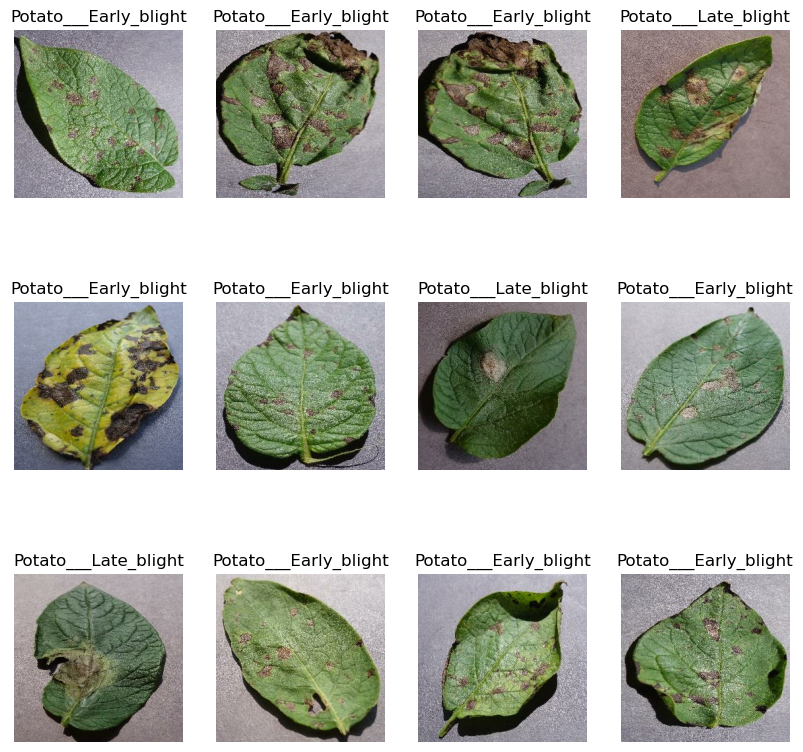

In [7]:
plt.figure(figsize=(10, 10))
for image_batch, labels_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

### Function to Split Dataset

Splitting dataset into 3 subsets, namely:
1. Training
2. Validation
3. Test

In [8]:
len(dataset)

68

In [9]:
train_size = 0.8
len(dataset)*train_size

54.400000000000006

In [10]:
train_ds = dataset.take(54)
len(train_ds)

54

In [11]:
test_ds = dataset.skip(54)
len(test_ds)

14

In [12]:
val_size=0.1
len(dataset)*val_size

6.800000000000001

In [13]:
val_ds = test_ds.take(6)
len(val_ds)

6

In [14]:
test_ds = test_ds.skip(6)
len(test_ds)

8

In [15]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [16]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

In [17]:
len(train_ds)

54

In [18]:
len(val_ds)

6

In [19]:
len(test_ds)

8

### Cache, Shuffle, and Prefetch the Dataset

In [20]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

## Building the Model

In [21]:
resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
  layers.experimental.preprocessing.Rescaling(1./255),
])

### Data Augmentation
Data Augmentation is needed when we have less data, this boosts the accuracy of our model by augmenting the data and 
to  expand the size and diversity of a training dataset by applying various transformations or modifications to the existing data.

In [22]:
data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.2),
])

#### Applying Data Augmentation to Train Dataset

In [23]:
train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)



In [24]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 3

model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

model.build(input_shape=input_shape)

In [25]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (32, 256, 256, 3)         0         
                                                                 
 conv2d (Conv2D)             (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (32, 127, 127, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (32, 62, 62, 64)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (32, 60, 60, 64)         

### Compiling the Model


In [24]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [25]:
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
)

Epoch 1/50
54/54 [==============================] - 74s 1s/step - loss: 0.9152 - accuracy: 0.4826 - val_loss: 0.9318 - val_accuracy: 0.4375
Epoch 2/50
54/54 [==============================] - 74s 1s/step - loss: 0.8367 - accuracy: 0.5446 - val_loss: 0.7751 - val_accuracy: 0.6042
Epoch 3/50
54/54 [==============================] - 74s 1s/step - loss: 0.5810 - accuracy: 0.7471 - val_loss: 0.5797 - val_accuracy: 0.6979
Epoch 4/50
54/54 [==============================] - 78s 1s/step - loss: 0.4478 - accuracy: 0.8061 - val_loss: 0.3499 - val_accuracy: 0.8177
Epoch 5/50
54/54 [==============================] - 75s 1s/step - loss: 0.3502 - accuracy: 0.8588 - val_loss: 0.5152 - val_accuracy: 0.7865
Epoch 6/50
54/54 [==============================] - 74s 1s/step - loss: 0.2656 - accuracy: 0.8970 - val_loss: 0.2604 - val_accuracy: 0.8958
Epoch 7/50
54/54 [==============================] - 74s 1s/step - loss: 0.1921 - accuracy: 0.9213 - val_loss: 0.7071 - val_accuracy: 0.8021
Epoch 8/50
54/54 [==

In [26]:
scores = model.evaluate(test_ds)

8/8 [==============================] - 7s 262ms/step - loss: 0.2953 - accuracy: 0.9336


**You can see above that we get 100.00% accuracy for our test dataset. This is considered to be a pretty good accuracy**

In [30]:
scores

[1.1010949611663818, 0.47265625]

Scores is just a list containing loss and accuracy value

### Plotting the Accuracy and Loss Curves

In [27]:
history

You can read documentation on history object here: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/History

In [28]:
history.params

{'verbose': 1, 'epochs': 50, 'steps': 54}

In [29]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

**loss, accuracy, val loss etc are a python list containing values of loss, accuracy etc at the end of each epoch**

In [30]:
type(history.history['loss'])

list

In [31]:
len(history.history['loss'])

50

In [32]:
history.history['loss'][:5] # show loss for first 5 epochs

[0.9151561856269836,
 0.836707353591919,
 0.5809652805328369,
 0.44775390625,
 0.35015732049942017]

In [33]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

Generating subplot to shows the training, validation accuracy curves and the training, validation loss curves.

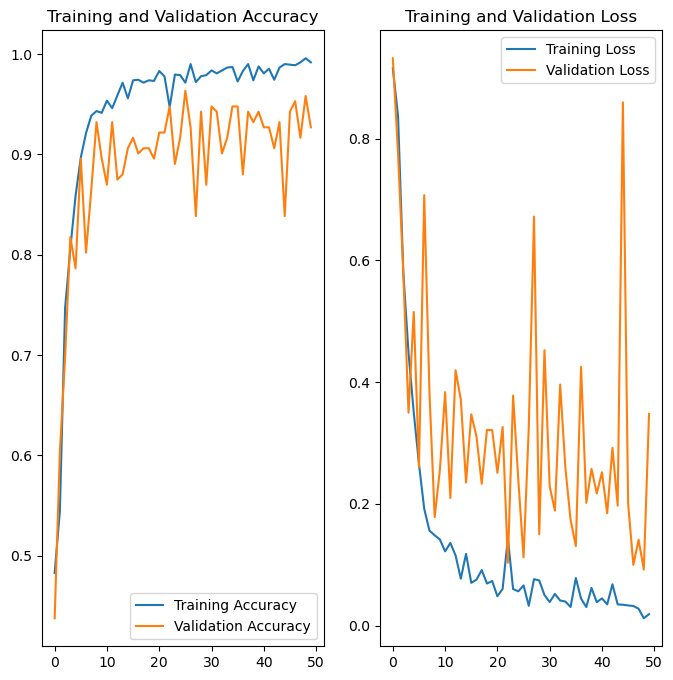

In [34]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Function for inference

In [26]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

In [27]:
model1 = tf.keras.models.load_model('my_potato_model.h5')

**Now run inference on few sample images**

1/1 [==============================] - 0s 233ms/step


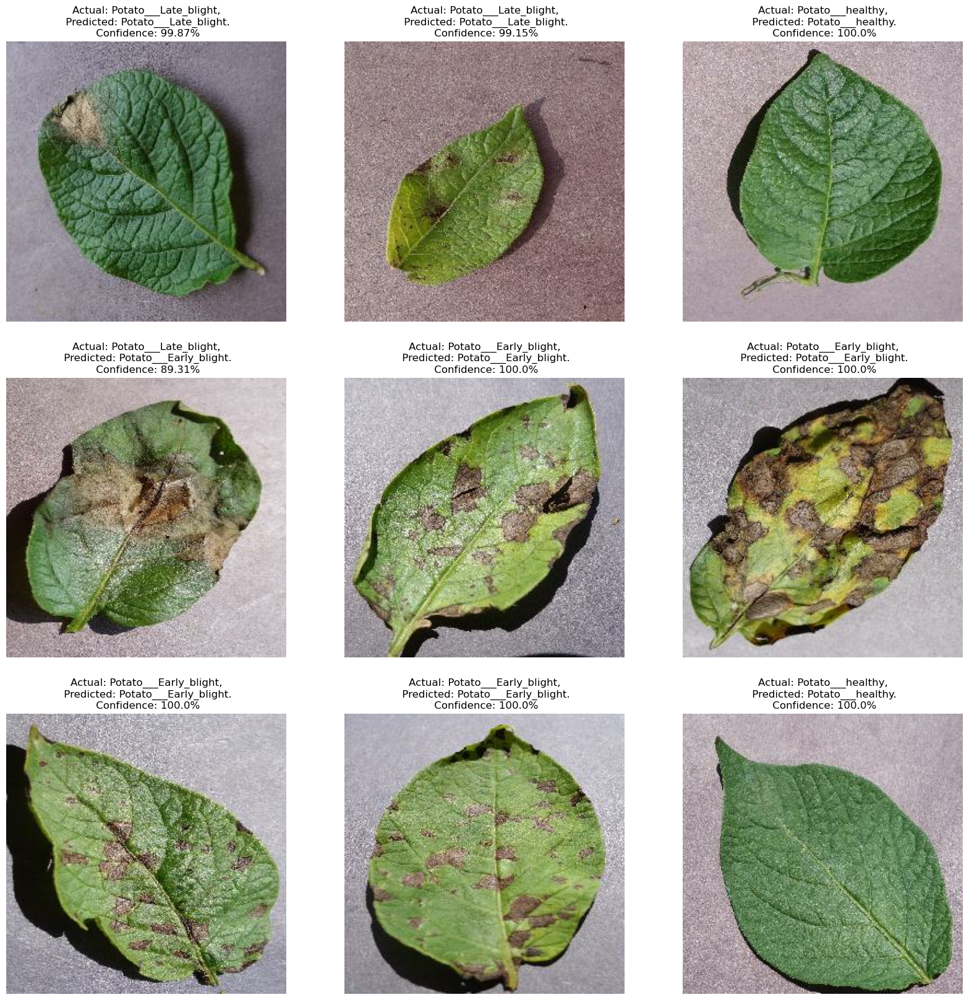

In [50]:
plt.figure(figsize=(20, 20))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model1, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

1/1 [==============================] - 0s 71ms/step


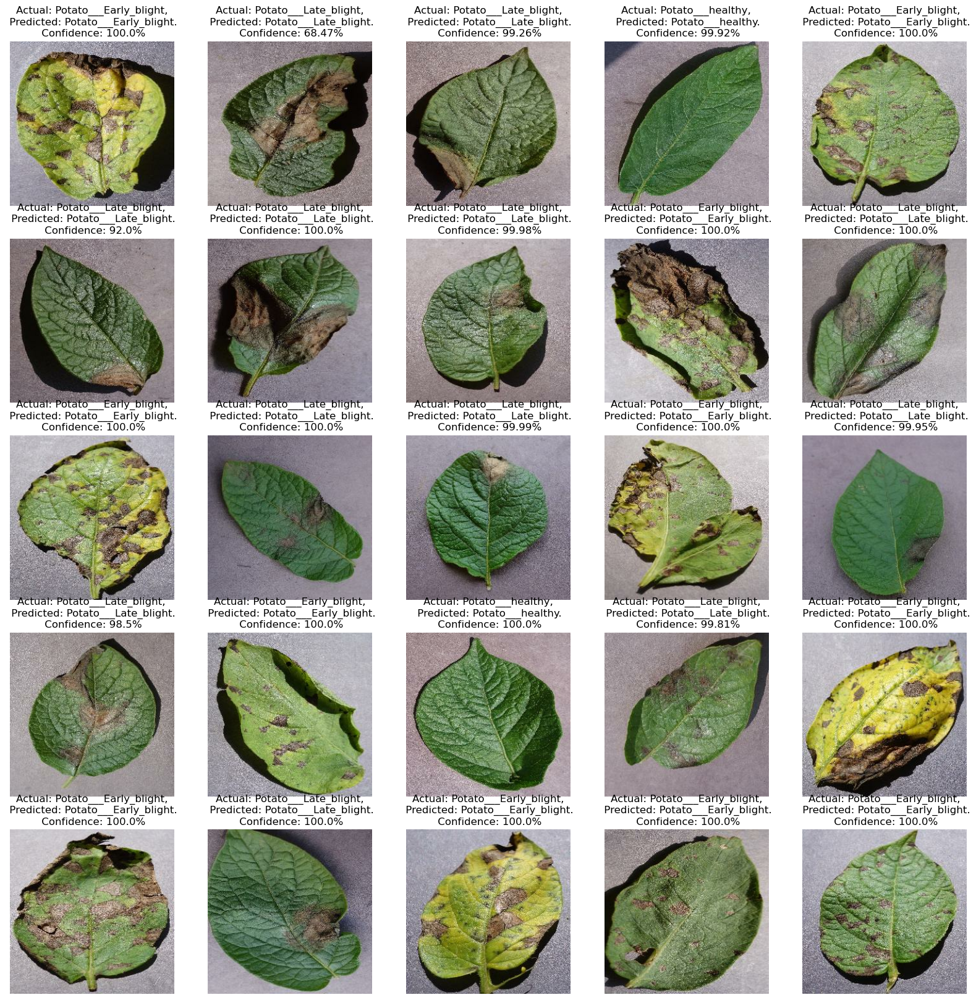

In [29]:
plt.figure(figsize=(20, 20))
import numpy as np
for images, labels in test_ds.take(1):
    for i in range(25):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model1, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

1/1 [==============================] - 0s 70ms/step


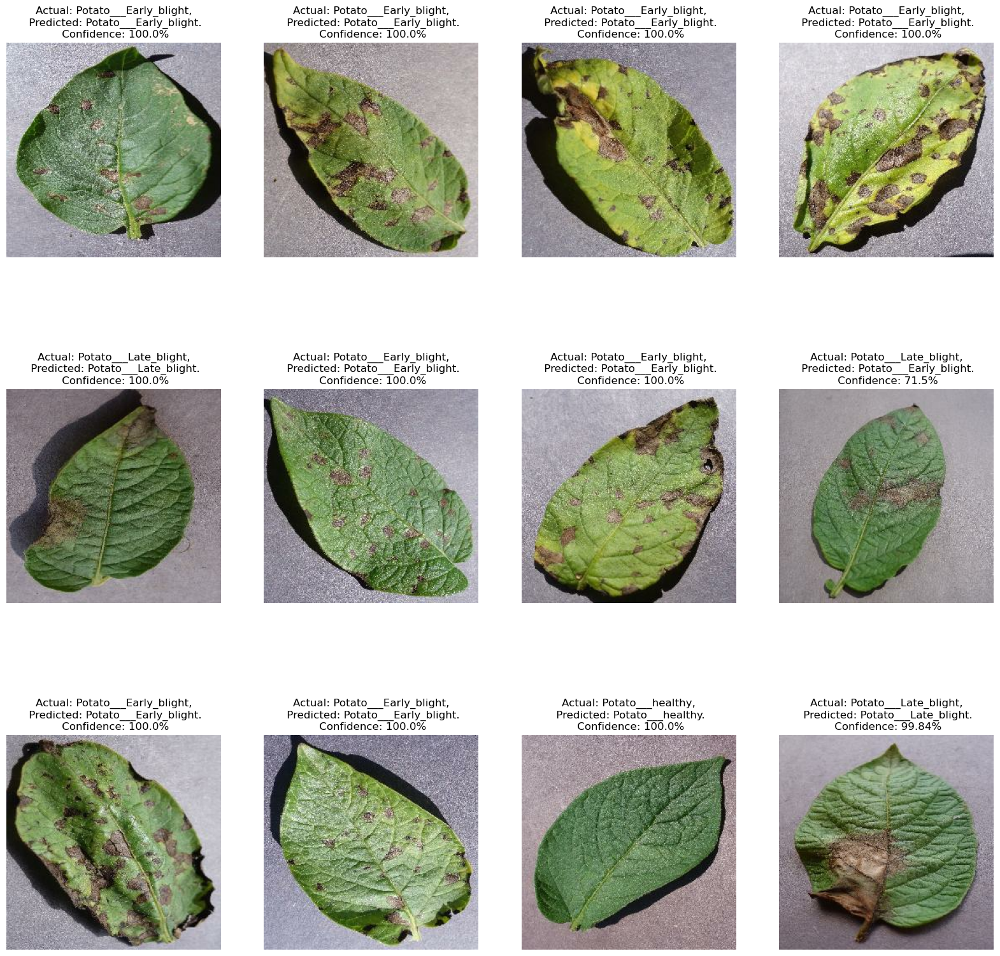

In [30]:
plt.figure(figsize=(20, 20))
import numpy as np
for images, labels in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model1, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

### Saving the Model
We append the model to the list of models as a new version

In [28]:
import tensorflow as tf

# Assuming your trained CNN model is stored in the variable 'model'
# and you want to save it as 'my_model.h5'

#model.save('my_potato_model.h5')


Plotting a subplot to compare the actual labels of dataset and labels predicted by model

1/1 [==============================] - 0s 293ms/step


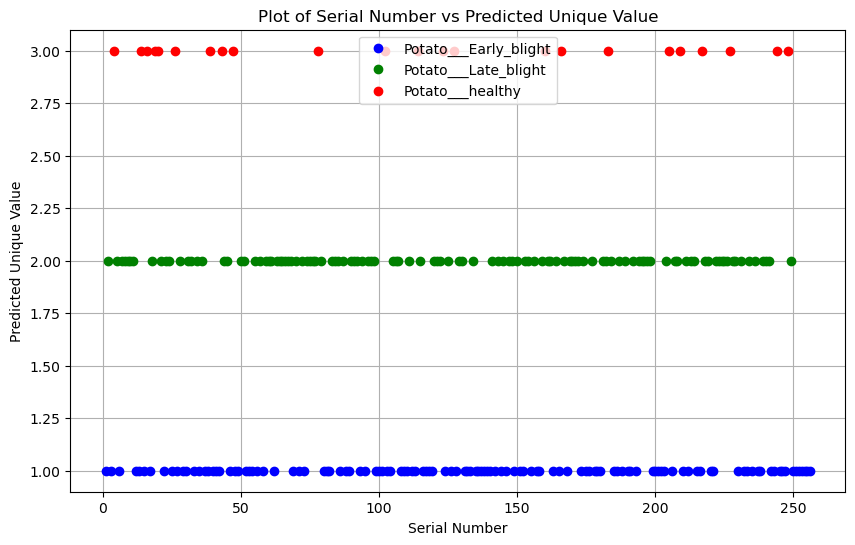

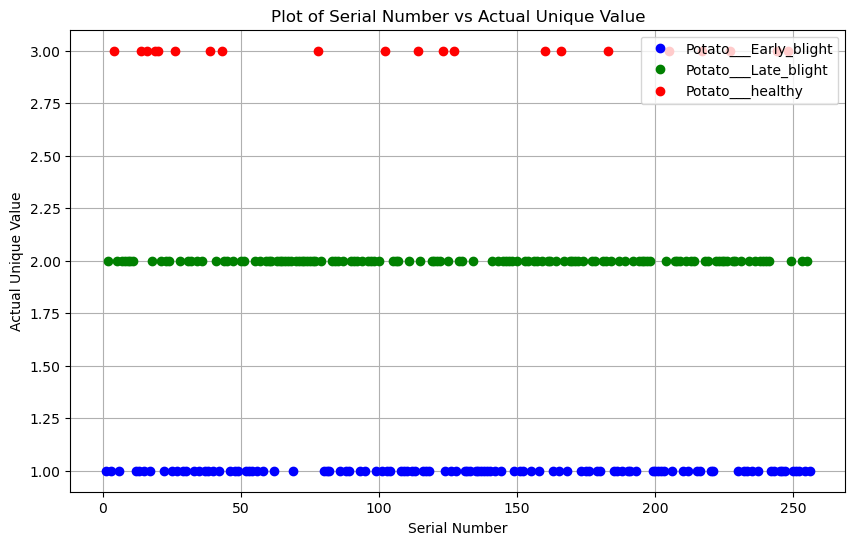

In [47]:
import pandas as pd
import matplotlib.pyplot as plt

def visualize_predictions(model, test_dataset, class_names):
    predictions = []
    actual_classes = []
    unique_predicted_values = {}
    unique_actual_values = {}
    colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black']

    for images, labels in test_dataset:
        batch_predictions = model.predict(images)
        predicted_classes = [class_names[prediction.argmax()] for prediction in batch_predictions]
        predictions.extend(predicted_classes)
        actual_classes.extend([class_names[label] for label in labels])

    # Create a dataframe with serial number, actual class, and predicted class
    df = pd.DataFrame({'Serial Number': range(1, len(predictions) + 1),
                       'Actual Class': actual_classes,
                       'Predicted Class': predictions})

    # Assign unique values for each predicted class
    unique_predicted_classes = df['Predicted Class'].unique()
    for i, unique_class in enumerate(unique_predicted_classes):
        unique_predicted_values[unique_class] = i + 1

    # Assign unique values for each actual class
    unique_actual_classes = df['Actual Class'].unique()
    for i, unique_class in enumerate(unique_actual_classes):
        unique_actual_values[unique_class] = i + 1

    # Add columns with the unique values for predicted and actual class
    df['Predicted Unique Value'] = df['Predicted Class'].map(unique_predicted_values)
    df['Actual Unique Value'] = df['Actual Class'].map(unique_actual_values)

    # Generate a plot between the serial number and predicted unique value
    plt.figure(figsize=(10, 6))
    for unique_class, color in zip(unique_predicted_classes, colors):
        class_df = df[df['Predicted Class'] == unique_class]
        plt.plot(class_df['Serial Number'], class_df['Predicted Unique Value'], 'o', label=unique_class, color=color)

    plt.xlabel('Serial Number')
    plt.ylabel('Predicted Unique Value')
    plt.title('Plot of Serial Number vs Predicted Unique Value')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Generate a plot between the serial number and actual unique value
    plt.figure(figsize=(10, 6))
    for unique_class, color in zip(unique_actual_classes, colors):
        class_df = df[df['Actual Class'] == unique_class]
        plt.plot(class_df['Serial Number'], class_df['Actual Unique Value'], 'o', label=unique_class, color=color)

    plt.xlabel('Serial Number')
    plt.ylabel('Actual Unique Value')
    plt.title('Plot of Serial Number vs Actual Unique Value')
    plt.legend()
    plt.grid(True)
    plt.show()

# Assuming you have a test dataset called 'test_ds' and a list of class names called 'class_names'

# Call the function to visualize predictions and generate the plots
visualize_predictions(model1, test_ds, class_names)


# By B. Sai Bhargav